# Worksheet 07

Name: William Huang
UID: U53888747

GitHub Repo Link (Branch worksheet_07): https://github.com/will18870/Data-Science-Fundamentals/tree/worksheet_07


### Topics

- Density-Based Clustering

### Density-Based Clustering

Follow along with the live coding of the DBScan algorithm.

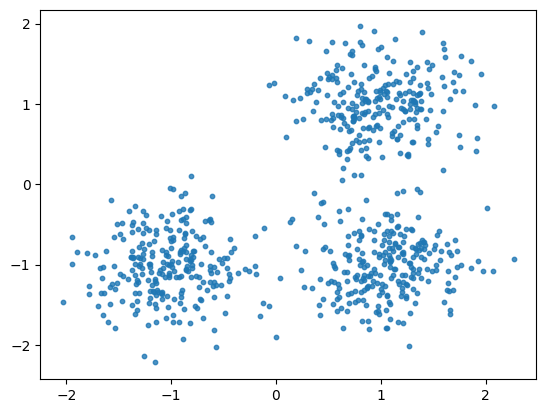

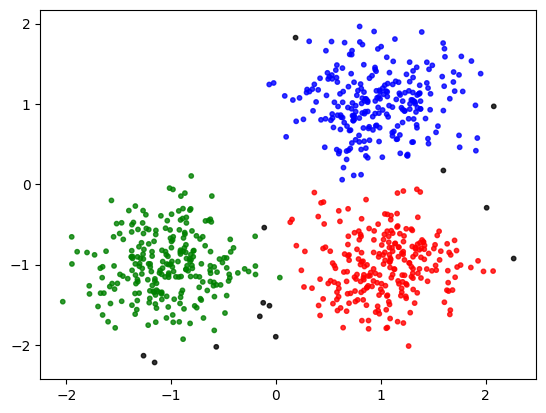

In [14]:
# credit to Anonymous Poet on Piazza (@184). Lost track during make_cluster

import numpy as np
import matplotlib.pyplot as plt
import sklearn.datasets as datasets
from PIL import Image as im


centers = [[1, 1], [-1, -1], [1, -1]]
X, _ = datasets.make_blobs(n_samples=750, centers=centers, cluster_std=0.4,
random_state=0)
plt.scatter(X[:, 0], X[:, 1], s=10, alpha=0.8)
plt.show()

TEMPFILE = "temp.png"

class DBC():

    # initialize class variables
    def __init__(self, dataset, min_pts, epsilon):
        self.dataset = dataset
        self.min_pts = min_pts
        self.epsilon = epsilon
        self.assignments = [-1 for _ in range(len(self.dataset))]
        self.snaps = []

    # return a distance vector (in this case a 1d vector, or a single euclidean distance) between two points
    def distance(self, i, j):
        return np.linalg.norm(self.dataset[i] - self.dataset[j])

    # return if a data point is a core point (if it has more than min_pts points in its eps-neighborhood)
    def is_core(self, i):
        return len(self.get_nbhd(i)) >= self.min_pts

    # return a list of points in the input point's eps-neighborhood
    def get_nbhd(self, i):
        nbhd = []
        for j in range(len(self.dataset)):
            if i != j and self.distance(i, j) <= self.epsilon:
                nbhd.append(j)
        return nbhd


    def is_unassigned(self, i):
        return self.assignments[i]==-1

    # return all points not assigned a neighborhood
    def get_unassigned_nbhd(self, i):
        nbhd = self.get_nbhd(i)
        return [pt for pt in nbhd if self.is_unassigned(pt)]

    # create a cluster and assign all points for that cluster
    def make_cluster(self, i, cluster_num):
        self.assignments[i] = cluster_num
        nbhd_q = self.get_unassigned_nbhd(i)
        
        self.snap(i)

        while nbhd_q:
            next_pt = nbhd_q.pop()
            if not self.is_unassigned(next_pt):
                continue
            self.assignments[next_pt] = cluster_num
            
            self.snap(next_pt)

            if self.is_core(next_pt):
                nbhd_q += self.get_unassigned_nbhd(next_pt)

    def dbscan(self):
        cluster_num = 0

        for i in range(len(self.dataset)):
            if self.assignments[i] != -1:
                continue
            if self.is_core(i):
                self.make_cluster(i, cluster_num)
                cluster_num += 1

        self.snaps[0].save(
            'dbscan.gif',
            optimize=False,
            save_all=True,
            append_images=self.snaps[1:],
            loop=0,
            duration=25
        )
        return self.assignments
    
    # snapshot function, pt is solely to identify where to put the circle for gif clarification
    def snap(self, pt):
        fig, ax = plt.subplots()
        colors = np.array([x for x in 'bgrcmykbgrcmykbgrcmykbgrcmyk'])
        colors = np.hstack([colors] * 100)
        ax.scatter(self.dataset[:, 0], self.dataset[:, 1], color=colors[self.assignments].tolist(), s=10, alpha=0.8)
        cir = plt.Circle((self.dataset[pt, 0], self.dataset[pt, 1]), 0.15, color='b', fill=False) # create circle around the point assigned
        ax.add_patch(cir)
        ax.set_aspect('equal')
        ax.set_xlim(np.min(self.dataset[:, 0]), np.max(self.dataset[:, 0]))
        ax.set_ylim(np.min(self.dataset[:, 1]), np.max(self.dataset[:, 1]))

        fig.savefig(TEMPFILE)
        plt.close()
        self.snaps.append(im.fromarray(np.asarray(im.open(TEMPFILE))))
    

clustering = DBC(X, 5, 0.3).dbscan()

colors = np.array([x for x in 'bgrcmykbgrcmykbgrcmykbgrcmyk'])
colors = np.hstack([colors] * 100)
plt.scatter(X[:, 0], X[:, 1], color=colors[clustering].tolist(), s=10, alpha=0.8)
plt.show()

## Challenge Problem

Using the code above and the template provided below, create the animation below of the DBScan algorithm.

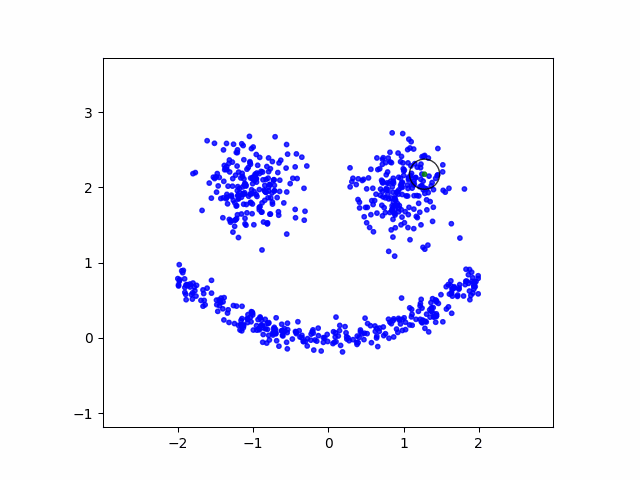

In [4]:
from IPython.display import Image
Image(filename="dbscan_2.gif", width=500, height=500)

Hints:

- First animate the dbscan algorithm for the dataset used in class (before trying to create the above dataset)
- Take a snapshot of the assignments when the point gets assigned to a cluster
- Confirm that the snapshot works by saving it to a file
- Don't forget to close the matplotlib plot after saving the figure
- Gather the snapshots in a list of images that you can then save as a gif using the code below
- Use `ax.set_aspect('equal')` so that the circles don't appear to be oval shaped
- To create the above dataset you need two blobs for the eyes. For the mouth you can use the following process to generate (x, y) pairs:
  - Pick an x at random in an interval that makes sense given where the eyes are positioned
  - For that x generate y that is 0.2 * x^2 plus a small amount of randomness
  - `zip` the x's and y's together and append them to the dataset containing the blobs

In [5]:
import numpy as np
from PIL import Image as im
import matplotlib.pyplot as plt
import sklearn.datasets as datasets

TEMPFILE = 'temp.png'

class DBC():

    def __init__(self, dataset, min_pts, epsilon):
        self.dataset = dataset
        self.min_pts = min_pts 
        self.epsilon = epsilon
        self.snaps = []


    def snapshot(self):
        fig, ax = plt.subplots()
        colors = np.array([x for x in 'bgrcmykbgrcmykbgrcmykbgrcmyk'])

        ax.scatter(...)
        cir = plt.Circle(...) # create circle around the point assigned
        ax.add_patch(cir)
        ax.set_xlim(...)
        ax.set_ylim(...)
        ax.set_aspect('equal') # necessary or else the circles appear to be oval shaped

        fig.savefig(TEMPFILE)
        plt.close()

        return im.fromarray(np.asarray(im.open(TEMPFILE)))


    def dbscan(self):
        ...
        return


centers = [...]
eyes, _ = datasets.make_blobs(...)

mouth_x = ... * np.random.random(...)
mouth_y = ... + .1 * np.random.randn(...)

face = np.append(eyes, ..., axis=0)

dbc = DBC(face, ..., ...)
clustering = dbc.dbscan()

dbc.snaps[0].save(
    'dbscan.gif',
    optimize=False,
    save_all=True,
    append_images=dbc.snaps[1:],
    loop=0,
    duration=25
)

InvalidParameterError: The 'n_samples' parameter of make_blobs must be an int in the range [1, inf) or an array-like. Got Ellipsis instead.